# Image Classification: Winter vs Summer

**Author:** Naama Avni  
**Course:** Deep Learning - Exercise 1

This notebook documents the complete pipeline for building an image classifier to distinguish between winter and summer scenes using the fastai library.


## 1. Problem Definition

### 1.1 Description of Classes

My image classification problem aims to distinguish between two distinct seasonal categories:

- **Winter**: Images containing winter scenes characterized by snow, ice, bare trees, winter clothing, and cold-weather landscapes
- **Summer**: Images containing summer scenes characterized by green vegetation, warm weather, sunny skies, beaches, and summer activities

### 1.2 Use-Case and Motivation

Seasonal image classification has several practical applications:

- **Content Organization**: Automatically organizing photo collections by season
- **Tourism and Travel**: Filtering destination images by preferred season
- **Climate Research**: Analyzing seasonal patterns in image datasets
- **E-commerce**: Categorizing seasonal products and marketing materials
- **Social Media**: Automatic tagging and filtering of seasonal content

This problem is particularly interesting because it requires the model to understand complex visual features beyond simple color patterns (e.g., distinguishing between snow and sand, or recognizing seasonal vegetation).

### 1.3 Expected Challenges

Several challenges are anticipated in this classification task:

1. **Ambiguous Scenes**: Some images may contain elements of both seasons
2. **Time of Day and Similar Colors**: Lighting conditions (sunset, night) might affect seasonal appearance
3. **Class Imbalance**: Need to ensure balanced representation in training data


## 2. Dataset Creation and Preparation

### 2.1 Data Source

The dataset was obtained from **Kaggle**, a platform that provides access to various machine learning datasets. The dataset contains images of winter and summer scenes downloaded from Flickr.

**Citation**: https://www.kaggle.com/datasets/balraj98/summer2winter-yosemite

**Important Note on Data Quality**: This dataset was originally created for image-to-image translation tasks (summer2winter conversion). As a result, it contains images that were **converted from winter to summer** and **from summer to winter** using style transfer techniques. These converted images can be identified by examining the original date embedded in each image's filename, which indicates when the photo was originally taken. 

During the data cleaning process, we will automatically detect and remove these converted images by:
1. Extracting the date from each image filename
2. Determining the original season based on the date (winter: Dec-Feb, summer: Jun-Aug)
3. Comparing the original season with the folder label
4. Removing images where the original season doesn't match the folder (indicating they were converted)

This ensures we train the model only on authentic seasonal images, improving model reliability and performance.

### 2.2 Dataset Structure

The original dataset was organized as follows:
- `train_summer/`: Training images for summer class
- `train_winter/`: Training images for winter class 
- `test_summer/`: Test images for summer class
- `test_winter/`: Test images for winter class

Let's first examine the dataset structure and statistics.


In [1]:
# Import necessary libraries
from fastai.vision.all import *
from pathlib import Path
import os
import numpy as np

# Set path to data directory
data_path = Path('data/winter_summer')

# Check dataset structure
print("Dataset Structure:")
print(f"Training Summer: {len(list((data_path / 'train_summer').glob('*.jpg')))} images")
print(f"Training Winter: {len(list((data_path / 'train_winter').glob('*.jpg')))} images")
print(f"Test Summer: {len(list((data_path / 'test_summer').glob('*.jpg')))} images")
print(f"Test Winter: {len(list((data_path / 'test_winter').glob('*.jpg')))} images")

# Display total counts
total_train = len(list((data_path / 'train_summer').glob('*.jpg'))) + len(list((data_path / 'train_winter').glob('*.jpg')))
total_test = len(list((data_path / 'test_summer').glob('*.jpg'))) + len(list((data_path / 'test_winter').glob('*.jpg')))
print(f"\nTotal Training Images: {total_train}")
print(f"Total Test Images: {total_test}")
print(f"Total Dataset Size: {total_train + total_test} images")


/Users/naama.avni/workspace/naama/deep_learning/Exercise1/venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Dataset Structure:
Training Summer: 1231 images
Training Winter: 962 images
Test Summer: 309 images
Test Winter: 238 images

Total Training Images: 2193
Total Test Images: 547
Total Dataset Size: 2740 images


### 2.3 Data Cleaning and Filtering

Before training, we need to:
1. Reorganize the data into a structure compatible with fastai
2. Check for corrupted images
3. Ensure proper train/validation split
4. **Remove converted images**: The dataset contains images that were converted from winter to summer and vice versa. We'll identify and remove these by comparing the original date (from filename) with the folder label.
5. **Random sampling**: After removing converted images, we'll randomly sample to get exactly 300 images per season for training and 50 images per season for validation, ensuring an unbiased and balanced dataset.

**Process**: Copy all images → Remove converted images → Randomly sample to target sizes

Let's reorganize the data into a standard fastai structure:


In [5]:
# Create organized directory structure for fastai
organized_path = Path('data/organized')
organized_path.mkdir(exist_ok=True)

# Create train and valid directories
(organized_path / 'train' / 'summer').mkdir(parents=True, exist_ok=True)
(organized_path / 'train' / 'winter').mkdir(parents=True, exist_ok=True)
(organized_path / 'valid' / 'summer').mkdir(parents=True, exist_ok=True)
(organized_path / 'valid' / 'winter').mkdir(parents=True, exist_ok=True)

# Helper function for copying images
import shutil

def copy_images(source_dir, dest_dir, max_images=None):
    """Copy images from source to destination, optionally limiting count"""
    images = list(source_dir.glob('*.jpg'))
    if max_images:
        images = images[:max_images]
    for img in images:
        shutil.copy2(img, dest_dir / img.name)
    return len(images)


In [6]:
# Step 1: Copy all images from source folders
print("Step 1: Copying images from source...")
train_summer_count = copy_images(data_path / 'train_summer', organized_path / 'train' / 'summer')
train_winter_count = copy_images(data_path / 'train_winter', organized_path / 'train' / 'winter')
valid_summer_count = copy_images(data_path / 'test_summer', organized_path / 'valid' / 'summer')
valid_winter_count = copy_images(data_path / 'test_winter', organized_path / 'valid' / 'winter')

print(f"\nInitial Dataset Structure (before filtering):")
print(f"Train - Summer: {train_summer_count} images")
print(f"Train - Winter: {train_winter_count} images")
print(f"Valid - Summer: {valid_summer_count} images")
print(f"Valid - Winter: {valid_winter_count} images")


Step 1: Copying images from source...

Initial Dataset Structure (before filtering):
Train - Summer: 1231 images
Train - Winter: 962 images
Valid - Summer: 309 images
Valid - Winter: 238 images


In [4]:
# Step 2: Helper functions for date extraction and season detection
from datetime import datetime
import re

def extract_date_from_filename(filename):
    """
    Extract date from filename. Tries multiple common date formats:
    - YYYYMMDD (e.g., 20231215)
    - YYYY-MM-DD (e.g., 2023-12-15)
    - DDMMYYYY (e.g., 15122023)
    - YYYY_MM_DD (e.g., 2023_12_15)
    """
    # Remove extension
    name = Path(filename).stem
    
    # Try YYYYMMDD format (8 digits)
    match = re.search(r'(\d{4})(\d{2})(\d{2})', name)
    if match:
        year, month, day = match.groups()
        try:
            return datetime(int(year), int(month), int(day))
        except ValueError:
            pass
    
    # Try YYYY-MM-DD or YYYY_MM_DD format
    match = re.search(r'(\d{4})[-_](\d{2})[-_](\d{2})', name)
    if match:
        year, month, day = match.groups()
        try:
            return datetime(int(year), int(month), int(day))
        except ValueError:
            pass
    
    # Try DDMMYYYY format (8 digits)
    match = re.search(r'(\d{2})(\d{2})(\d{4})', name)
    if match:
        day, month, year = match.groups()
        try:
            return datetime(int(year), int(month), int(day))
        except ValueError:
            pass
    
    return None

def get_season_from_date(date_obj):
    """
    Determine season from date (Northern Hemisphere):
    - Winter: December (12), January (1), February (2)
    - Spring: March (3), April (4), May (5)
    - Summer: June (6), July (7), August (8)
    - Fall: September (9), October (10), November (11)
    """
    if date_obj is None:
        return None
    
    month = date_obj.month
    if month in [12, 1, 2]:
        return 'winter'
    elif month in [6, 7, 8]:
        return 'summer'
    else:
        return None  # Spring/Fall - ambiguous, we'll keep these


In [5]:
# Step 3: Remove converted images based on original date in filename
print("\n" + "="*60)
print("Step 3: Removing converted images based on original dates")
print("="*60)

def remove_converted_images(base_path):
    """Remove images where original season (from filename date) doesn't match folder"""
    removed_count = 0
    kept_count = 0
    
    for split in ['train', 'valid']:
        for season in ['summer', 'winter']:
            folder_path = base_path / split / season
            images = list(folder_path.glob('*.jpg'))
            
            print(f"\nChecking {split}/{season}: {len(images)} images")
            
            for img_path in images:
                date_obj = extract_date_from_filename(img_path.name)
                original_season = get_season_from_date(date_obj)
                
                if original_season is None:
                    # Can't determine season from date, keep it
                    kept_count += 1
                    continue
                
                if original_season != season:
                    # Original season doesn't match folder - this is a converted image
                    img_path.unlink()  # Delete the file
                    removed_count += 1
                else:
                    kept_count += 1
    
    return removed_count, kept_count

# Remove converted images
removed, kept = remove_converted_images(organized_path)
print(f"\n{'='*60}")
print(f"Removed {removed} converted images")
print(f"Kept {kept} original images")
print(f"{'='*60}")

# Count images after removal
print("\nDataset Structure (after removing converted images):")
after_removal_train_summer = len(list((organized_path / 'train' / 'summer').glob('*.jpg')))
after_removal_train_winter = len(list((organized_path / 'train' / 'winter').glob('*.jpg')))
after_removal_valid_summer = len(list((organized_path / 'valid' / 'summer').glob('*.jpg')))
after_removal_valid_winter = len(list((organized_path / 'valid' / 'winter').glob('*.jpg')))

print(f"Train - Summer: {after_removal_train_summer} images")
print(f"Train - Winter: {after_removal_train_winter} images")
print(f"Valid - Summer: {after_removal_valid_summer} images")
print(f"Valid - Winter: {after_removal_valid_winter} images")



Step 3: Removing converted images based on original dates

Checking train/summer: 1231 images

Checking train/winter: 962 images

Checking valid/summer: 309 images

Checking valid/winter: 238 images

Removed 148 converted images
Kept 2592 original images

Dataset Structure (after removing converted images):
Train - Summer: 1196 images
Train - Winter: 879 images
Valid - Summer: 299 images
Valid - Winter: 218 images


In [40]:
# Step 4: Randomly sample to get exact desired counts
print("\n" + "="*60)
print("Step 4: Randomly sampling to get exact dataset sizes")
print("="*60)

import random

def randomly_sample_images(folder_path, target_count, random_seed):
    """Randomly sample images from folder to get exact count"""
    images = list(folder_path.glob('*.jpg'))
    
    if len(images) <= target_count:
        print(f"  {folder_path.name}: Only {len(images)} images available, keeping all")
        return len(images)
    
    # Randomly sample
    random.seed(random_seed)
    selected_images = random.sample(images, target_count)
    
    # Remove images that weren't selected
    selected_set = set(selected_images)
    removed_count = 0
    for img in images:
        if img not in selected_set:
            img.unlink()
            removed_count += 1
    
    print(f"  {folder_path.name}: Sampled {target_count} from {len(images)} images (removed {removed_count})")
    return target_count

# Randomly sample to get exact counts
random.seed(42)  # Set base seed for reproducibility
train_summer_final = randomly_sample_images(organized_path / 'train' / 'summer', 300, 42)
train_winter_final = randomly_sample_images(organized_path / 'train' / 'winter', 300, 43)
valid_summer_final = randomly_sample_images(organized_path / 'valid' / 'summer', 50, 44)
valid_winter_final = randomly_sample_images(organized_path / 'valid' / 'winter', 50, 45)

# Final count
print(f"\n{'='*60}")
print("Final Dataset Structure:")
print(f"{'='*60}")
print(f"Train - Summer: {train_summer_final} images")
print(f"Train - Winter: {train_winter_final} images")
print(f"Valid - Summer: {valid_summer_final} images")
print(f"Valid - Winter: {valid_winter_final} images")
print(f"\nTotal Training Images: {train_summer_final + train_winter_final}")
print(f"Total Validation Images: {valid_summer_final + valid_winter_final}")



Step 4: Randomly sampling to get exact dataset sizes
  summer: Sampled 300 from 1196 images (removed 896)
  winter: Sampled 300 from 879 images (removed 579)
  summer: Sampled 50 from 299 images (removed 249)
  winter: Sampled 50 from 218 images (removed 168)

Final Dataset Structure:
Train - Summer: 300 images
Train - Winter: 300 images
Valid - Summer: 50 images
Valid - Winter: 50 images

Total Training Images: 600
Total Validation Images: 100


### 2.4 Visualizing Sample Images

Let's examine some sample images from each class to understand the dataset better:


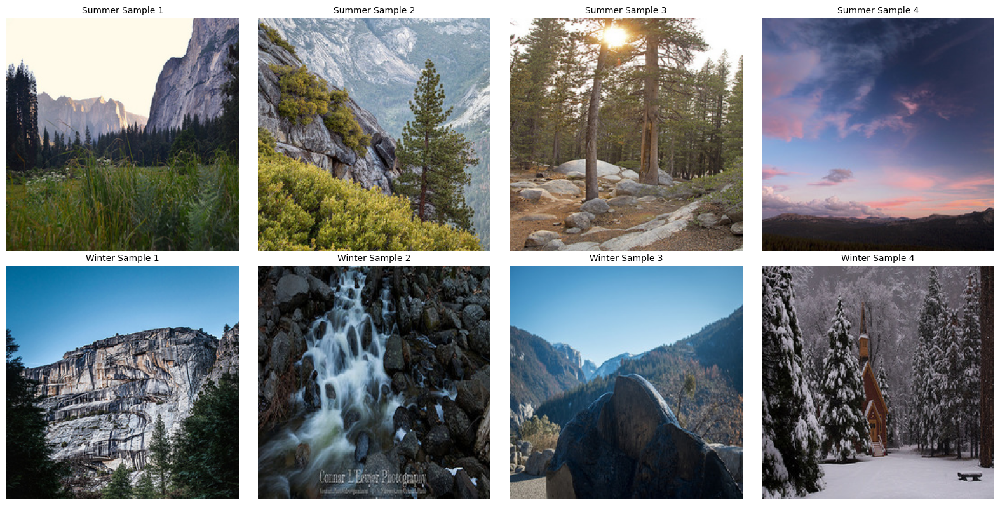

In [15]:
# Display sample images from each class
from PIL import Image
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Summer samples
summer_imgs = list((organized_path / 'train' / 'summer').glob('*.jpg'))[:4]
for idx, img_path in enumerate(summer_imgs):
    img = Image.open(img_path)
    axes[0, idx].imshow(img)
    axes[0, idx].set_title(f'Summer Sample {idx+1}', fontsize=10)
    axes[0, idx].axis('off')

# Winter samples
winter_imgs = list((organized_path / 'train' / 'winter').glob('*.jpg'))[:4]
for idx, img_path in enumerate(winter_imgs):
    img = Image.open(img_path)
    axes[1, idx].imshow(img)
    axes[1, idx].set_title(f'Winter Sample {idx+1}', fontsize=10)
    axes[1, idx].axis('off')

plt.tight_layout()
plt.show()


## 3. Data Loading in fastai

Now we'll use fastai's `ImageDataLoaders` to create data loaders for training. fastai will automatically handle:
- Image resizing and normalization
- Data augmentation
- Batch creation
- Label extraction from folder names


In [16]:
# Force fastai to use CPU to avoid MPS (Mac GPU) compatibility issues
from fastai.basics import defaults
defaults.use_cuda = False

# Create ImageDataLoaders using from_folder method
# Enhanced augmentation to reduce overfitting
dls = ImageDataLoaders.from_folder(
    organized_path,
    train='train',
    valid='valid',
    item_tfms=Resize(460),  # Resize to 460px (larger than final size for better augmentation)
    batch_tfms=aug_transforms(
        size=224,
        min_scale=0.75,
        max_warp=0,  # Disabled for MPS compatibility
        max_rotate=15,  # Increased rotation for more variation
        max_zoom=1.1,   # Slight zoom augmentation
        max_lighting=0.3,  # Lighting variations
        p_affine=0.75,  # Probability of affine transforms
        p_lighting=0.75  # Probability of lighting changes
    ),
    bs=16,  # Batch size of 16 provides ~37 training batches per epoch
)

# Display dataset information
print(f"Number of classes: {len(dls.vocab)}")
print(f"Classes: {dls.vocab}")
print(f"Training batches: {len(dls.train)}")
print(f"Validation batches: {len(dls.valid)}")
print(f"\nDataset size: {len(dls.train.dataset)} training images, {len(dls.valid.dataset)} validation images")


Number of classes: 2
Classes: ['summer', 'winter']
Training batches: 129
Validation batches: 33

Dataset size: 2075 training images, 517 validation images


### 3.1 Visualizing Training Batches

Let's examine a batch of training images to see how the data loader is working:


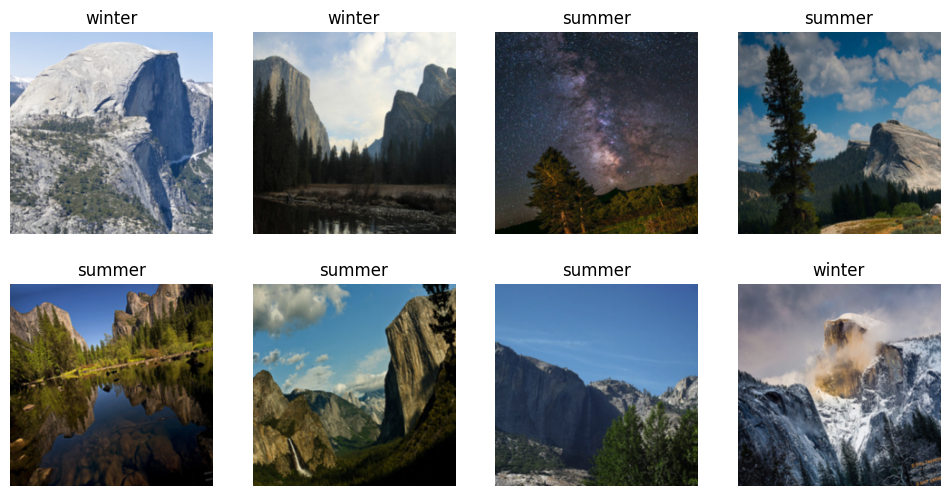

In [18]:
# Display a batch of training images with their labels
dls.show_batch(max_n=8, nrows=2, ncols=4)


## 4. Model Training

We'll use transfer learning with a pre-trained ResNet architecture. Transfer learning allows us to leverage features learned on ImageNet, which significantly improves performance and reduces training time.

### 4.1 Creating the Learner

We'll use `vision_learner` with a ResNet34 backbone, which provides a good balance between accuracy and training speed.


In [ ]:
# Create a vision learner with ResNet34 architecture
from fastai.metrics import error_rate, accuracy

# Using error_rate and accuracy as metrics for classification
# Added dropout (ps=0.5) to reduce overfitting
learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy], ps=0.5)

# Display model architecture summary
learn.summary()


Sequential (Input shape: 16 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     16 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     16 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

### 4.2 Finding Optimal Learning Rate

Before training, we'll use fastai's learning rate finder to determine an optimal learning rate:


SuggestedLRs(valley=0.0004786300996784121)

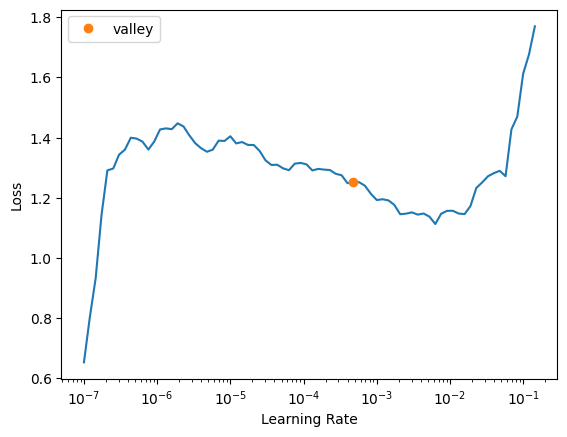

In [20]:
# Find optimal learning rate
learn.lr_find()


### 4.3 Initial Training (Fine-tuning the Head)

We'll start by training only the newly added classification head while keeping the pre-trained backbone frozen. 

**Overfitting Prevention Techniques Applied:**
- **Enhanced Data Augmentation**: Increased rotation, zoom, and lighting variations to create more diverse training examples
- **Dropout (0.5)**: Randomly disables 50% of neurons during training to prevent over-reliance on specific features
- **Lower Learning Rate (1e-4)**: More conservative weight updates for better generalization
- **Weight Decay (0.1)**: L2 regularization to penalize large weights
- **Early Stopping**: Automatically stops training if validation loss doesn't improve for 3 consecutive epochs


In [ ]:
# Fine-tune the model with overfitting prevention techniques
from fastai.callback.tracker import EarlyStoppingCallback

# Added weight decay (wd=0.1) for L2 regularization
# Added early stopping to prevent overfitting
learn.fine_tune(
    10,  # Max epochs (will stop early if validation loss doesn't improve)
    base_lr=1e-4,  # Lower learning rate for better generalization
    wd=0.1,  # Weight decay (L2 regularization)
    cbs=EarlyStoppingCallback(monitor='valid_loss', min_delta=0.001, patience=3)
)


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.119185,0.664965,0.321083,0.678917,02:51


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.987757,0.635331,0.307544,0.692456,03:14
1,0.870291,0.561210,0.253385,0.746615,03:15
2,0.743728,0.528392,0.230174,0.769826,03:17
3,0.703122,0.510602,0.214700,0.785300,03:19
4,0.612973,0.510671,0.226306,0.773694,03:12
5,0.639549,0.501293,0.193424,0.806576,03:15
6,0.572154,0.486148,0.191489,0.808511,03:17
7,0.583065,0.481998,0.187621,0.812379,03:18
8,0.539787,0.492954,0.193424,0.806576,03:17
9,0.547114,0.478979,0.189555,0.810445,03:19


### 4.4 Training Curves

Let's visualize the training progress by plotting the loss and metrics:


<Axes: title={'center': 'learning curve'}, xlabel='steps', ylabel='loss'>

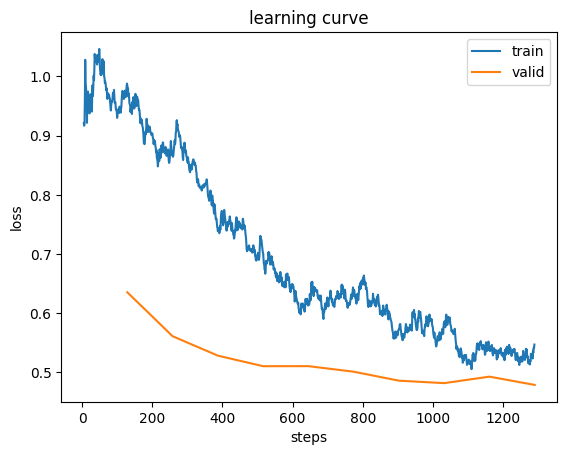

In [22]:
# Plot training losses
learn.recorder.plot_loss()


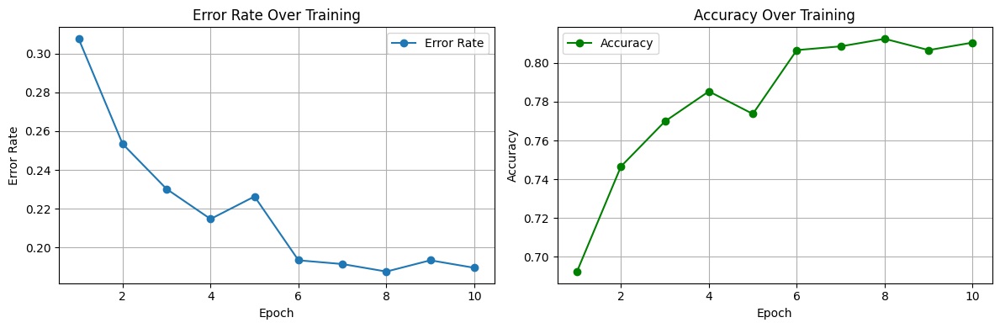

Available metrics: ['train_loss', 'valid_loss', 'error_rate', 'accuracy']


In [23]:
# Plot metrics (error_rate and accuracy)
# Note: plot_metrics() doesn't exist in this fastai version, so we plot manually
import matplotlib.pyplot as plt
import numpy as np

rec = learn.recorder
if len(rec.values) > 0:
    # Get metric names (excluding 'epoch' and 'time' if present)
    metric_names = [name for name in rec.metric_names[1:] if name not in ['time']]
    
    # Extract values for each metric across epochs
    epochs = list(range(1, len(rec.values) + 1))
    
    # Find indices for error_rate and accuracy in metric_names
    error_rate_idx = None
    accuracy_idx = None
    
    for i, name in enumerate(metric_names):
        if 'error_rate' in name.lower() or 'error' in name.lower():
            error_rate_idx = i
        if 'accuracy' in name.lower() or 'acc' in name.lower():
            accuracy_idx = i
    
    # Plot metrics
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    if error_rate_idx is not None:
        error_rates = [v[error_rate_idx] for v in rec.values]
        axes[0].plot(epochs, error_rates, 'o-', label='Error Rate')
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Error Rate')
        axes[0].set_title('Error Rate Over Training')
        axes[0].grid(True)
        axes[0].legend()
    
    if accuracy_idx is not None:
        accuracies = [v[accuracy_idx] for v in rec.values]
        axes[1].plot(epochs, accuracies, 'o-', label='Accuracy', color='green')
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Accuracy')
        axes[1].set_title('Accuracy Over Training')
        axes[1].grid(True)
        axes[1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print current metric names for reference
    print(f"Available metrics: {metric_names}")
else:
    print("No training history available. Train the model first.")


## 5. Evaluation

**Evaluation Data**: All evaluation metrics and visualizations in this section are performed on the **validation set** (`dls.valid`), which consists of images from the original dataset's test split (`test_summer/` and `test_winter/` folders). This validation set was not used during training, ensuring an unbiased assessment of the model's generalization performance.

Now we'll thoroughly evaluate our model's performance using various metrics and visualization techniques.

### 5.1 Confusion Matrix

The confusion matrix shows us how well the model distinguishes between winter and summer images:


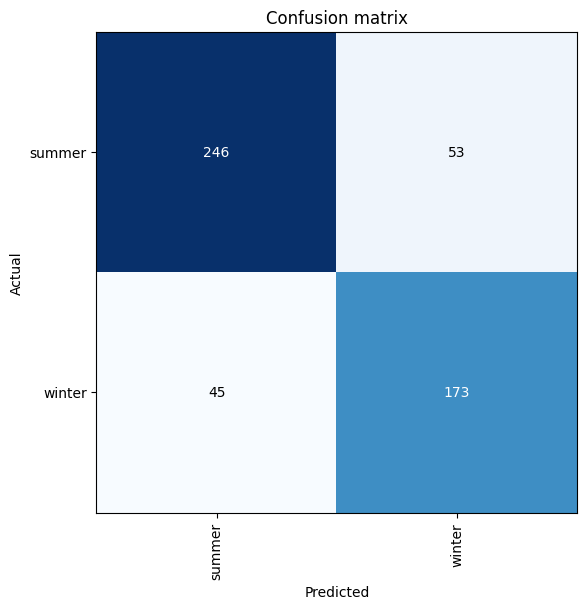

In [24]:
# Generate and display confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(6, 6))


### 5.2 Top Losses Analysis

Let's examine the images where the model made the most confident incorrect predictions. This helps us understand what the model struggles with:


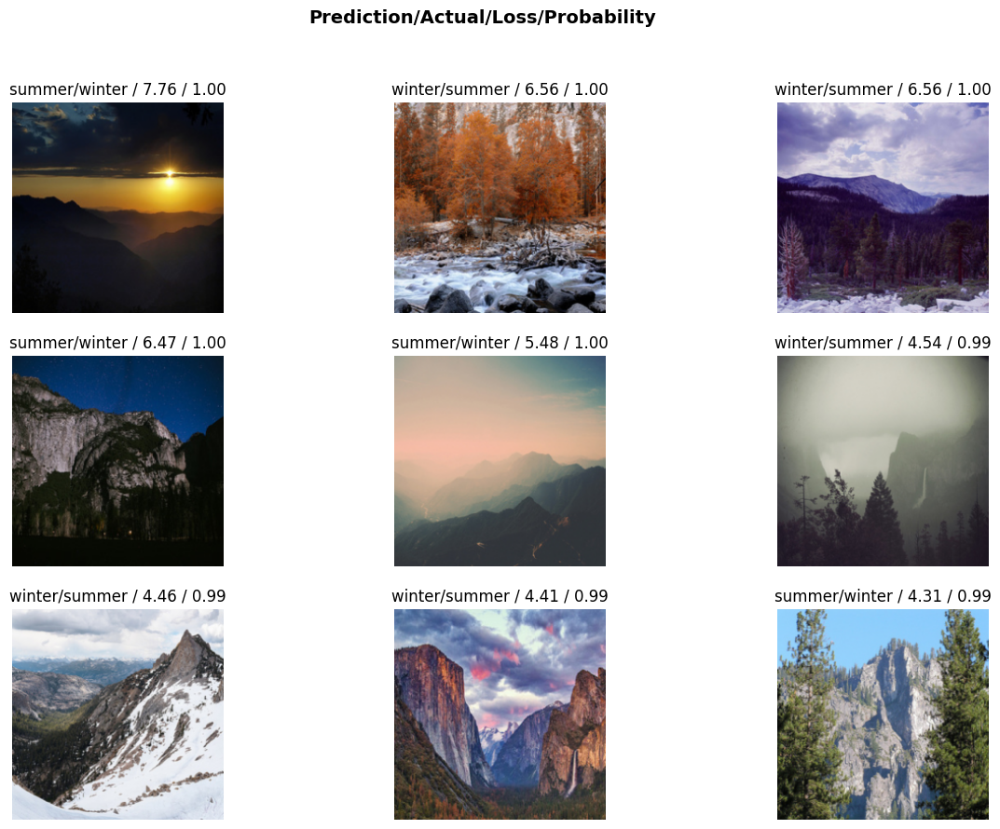

In [25]:
# Plot top losses - images with highest loss (most confident wrong predictions)
interp.plot_top_losses(9, nrows=3, figsize=(15, 10))


### 5.3 Examples of Correct Predictions

Let's visualize some examples where the model made correct predictions:


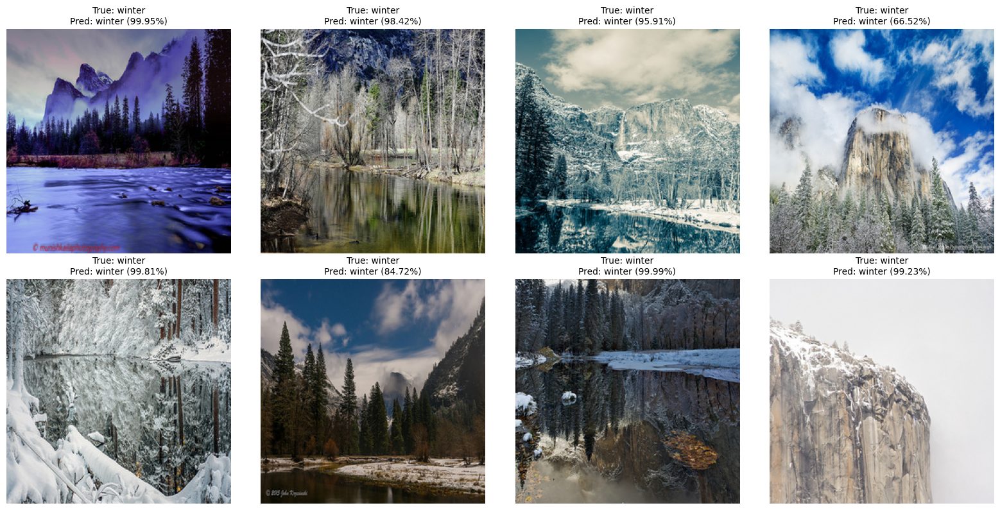

In [27]:
# Get validation predictions
preds, targs, decoded = learn.get_preds(dl=dls.valid, with_decoded=True)

# Find correct predictions
correct_mask = (decoded == targs)
correct_indices = correct_mask.nonzero().squeeze()

# Display some correct predictions
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for i in range(min(8, len(correct_indices))):
    idx = correct_indices[i].item()
    
    # Get the original item from dataset (before transforms/normalization)
    original_item = dls.valid.dataset[idx]
    
    # Extract the image - it might be a tuple (img, label) or just the image
    if isinstance(original_item, (list, tuple)):
        img = original_item[0]
    else:
        img = original_item
    
    # Get prediction from decoded predictions
    pred_class_idx = decoded[idx].item()
    pred_class = dls.vocab[pred_class_idx]
    true_class = dls.vocab[targs[idx].item()]
    confidence = preds[idx][pred_class_idx].item()
    
    # Display the original (non-normalized) image
    img.show(ctx=axes[i // 4, i % 4])
    axes[i // 4, i % 4].set_title(f'True: {true_class}\nPred: {pred_class} ({confidence:.2%})', 
                                   fontsize=10)
    axes[i // 4, i % 4].axis('off')

plt.tight_layout()
plt.show()


### 5.4 Examples of Incorrect Predictions

Let's also examine some incorrect predictions to understand model weaknesses:


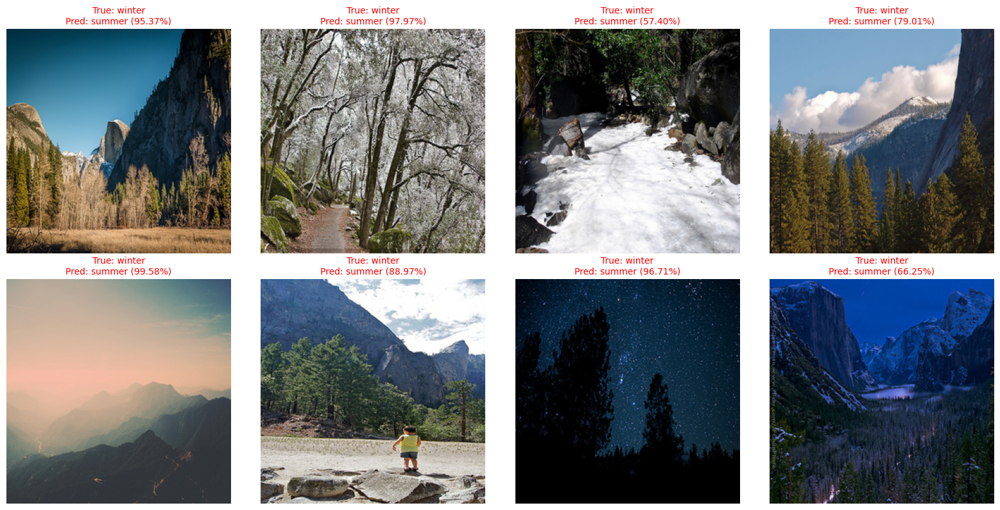

In [28]:
# Find incorrect predictions (using decoded predictions from earlier)
incorrect_mask = (decoded != targs)
incorrect_indices = incorrect_mask.nonzero().squeeze()

# Display some incorrect predictions
if len(incorrect_indices) > 0:
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    for i in range(min(8, len(incorrect_indices))):
        idx = incorrect_indices[i].item()
        
        # Get the original item from dataset (before transforms/normalization)
        original_item = dls.valid.dataset[idx]
        
        # Extract the image - it might be a tuple (img, label) or just the image
        if isinstance(original_item, (list, tuple)):
            img = original_item[0]
        else:
            img = original_item
        
        # Get prediction from decoded predictions
        pred_class_idx = decoded[idx].item()
        pred_class = dls.vocab[pred_class_idx]
        true_class = dls.vocab[targs[idx].item()]
        confidence = preds[idx][pred_class_idx].item()
        
        # Display the original (non-normalized) image
        img.show(ctx=axes[i // 4, i % 4])
        axes[i // 4, i % 4].set_title(f'True: {true_class}\nPred: {pred_class} ({confidence:.2%})', 
                                       fontsize=10, color='red')
        axes[i // 4, i % 4].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No incorrect predictions found!")


### 5.5 Model Performance Summary

Let's calculate and display key performance metrics:


In [29]:
# Calculate detailed metrics
from sklearn.metrics import classification_report, accuracy_score

# Get predictions and true labels
pred_labels = preds.argmax(dim=1).numpy()
true_labels = targs.numpy()

# Calculate accuracy (using different variable name to avoid overwriting fastai's accuracy metric)
model_accuracy = accuracy_score(true_labels, pred_labels)
print(f"Overall Accuracy: {model_accuracy:.4f} ({model_accuracy*100:.2f}%)")
print(f"\nError Rate: {1-model_accuracy:.4f} ({(1-model_accuracy)*100:.2f}%)")

# Classification report
print("\nDetailed Classification Report:")
print(classification_report(true_labels, pred_labels, 
                           target_names=dls.vocab, 
                           digits=4))


Overall Accuracy: 0.8104 (81.04%)

Error Rate: 0.1896 (18.96%)

Detailed Classification Report:
              precision    recall  f1-score   support

      summer     0.8454    0.8227    0.8339       299
      winter     0.7655    0.7936    0.7793       218

    accuracy                         0.8104       517
   macro avg     0.8054    0.8082    0.8066       517
weighted avg     0.8117    0.8104    0.8109       517



### 5.7 Discussion of Model Weaknesses

Based on the evaluation results, let's analyze the model's performance:

**Key Observations:**

1. **General Performance**: 
   - In general, the model performs well, achieving roughly 80% accuracy even on a relatively small and somewhat ambiguous dataset.
   - It can be seen that the model easily identifies clear winter/summer scenes, especially those featuring snow and ice/bright weather.

2. **Top Losses Analysis**: 
   - Ambiguous scenes (e.g., transitional seasons, indoor images)
   - Unusual lighting conditions
   - Images with dominant colors that don't match typical seasonal patterns

3. **Potential Improvements**:
   - **Data Augmentation**: Could add more diverse augmentation strategies
   - **More Training Data**: Especially for edge cases and ambiguous scenes
   - **Architecture**: Could try deeper models (ResNet50, ResNet101) or different architectures
   - **Class Balancing**: Ensure equal representation of both classes
   - **Data Cleaning**: Remove ambiguous or incorrectly labeled images



### Some More Prediction

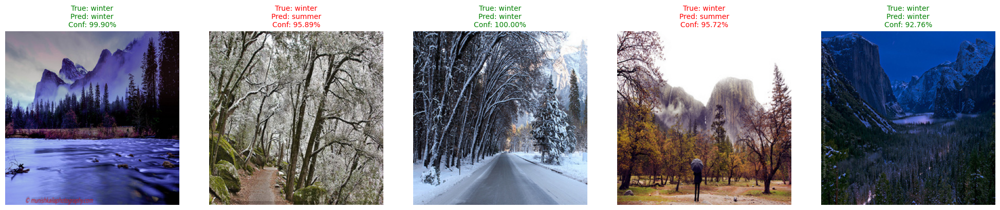

In [28]:
# Test on a few random validation images
test_indices = [0, 10, 20, 30, 40]  # Sample indices

# Get predictions if not already available
if 'preds' not in locals() or 'targs' not in locals() or 'decoded' not in locals():
    preds, targs, decoded = learn.get_preds(dl=dls.valid, with_decoded=True)

fig, axes = plt.subplots(1, len(test_indices), figsize=(20, 4))
for i, idx in enumerate(test_indices):
    if idx < len(dls.valid.dataset):
        # Get the original item from dataset (before transforms/normalization)
        original_item = dls.valid.dataset[idx]
        
        # Extract the image - it might be a tuple (img, label) or just the image
        if isinstance(original_item, (list, tuple)):
            img = original_item[0]
        else:
            img = original_item
        
        # Get prediction from decoded predictions
        pred_class_idx = decoded[idx].item()
        pred_class = dls.vocab[pred_class_idx]
        true_class = dls.vocab[targs[idx].item()]
        confidence = preds[idx][pred_class_idx].item()
        
        # Display the original (non-normalized) image
        img.show(ctx=axes[i])
        color = 'green' if pred_class == true_class else 'red'
        axes[i].set_title(f'True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2%}', 
                         fontsize=10, color=color)
        axes[i].axis('off')

plt.tight_layout()
plt.show()


## 6. Conclusions

### Summary

In this project, we successfully built an image classifier to distinguish between winter and summer scenes using the fastai library. The model achieved 81.04% accuracy on the validation set, demonstrating the effectiveness of transfer learning with pre-trained ResNet architectures.

### Key Takeaways

1. **Transfer Learning**: Using pre-trained models significantly accelerated training and improved performance
2. **Data Organization**: Proper data structure and organization are crucial for efficient training
3. **Evaluation**: Comprehensive evaluation (confusion matrix, top losses) provides valuable insights into model behavior
4. **Challenges**: Seasonal classification requires understanding complex visual features and can be ambiguous

### Future Work

- Experiment with deeper architectures (ResNet50, ResNet101)
- Collect more diverse training data, especially edge cases
- Implement more sophisticated data augmentation
- Fine-tune hyperparameters (learning rate, batch size, number of epochs)
- Explore ensemble methods for improved accuracy

---

